In [177]:
import numpy as np
import sklearn.datasets as datasets
import matplotlib.pyplot as plt

def tanh_derivative(z):
    return 1 - np.tanh(z) ** 2

def softmax(z):
    exp_z = np.exp(z - np.max(z, axis=1, keepdims=True))
    return exp_z / exp_z.sum(axis=1, keepdims=True)

def cross_entropy_loss(y_true, y_pred):
    return -np.mean(np.sum(y_true * np.log(y_pred + 1e-9), axis=1))


In [178]:
class NeuralNetwork:
    def __init__(self, learning_rate=0.01):

        self.learning_rate = learning_rate

        # Pesos e bias da primeira camada oculta
        self.W1 = np.random.randn(4, 4)
        self.b1 = np.zeros((1, 4))
        
        # Pesos e bias da segunda camada oculta
        self.W2 = np.random.randn(4, 4)
        self.b2 = np.zeros((1, 4))
        
        # Pesos e bias da camada de saída
        self.W3 = np.random.randn(4, 4)
        self.b3 = np.zeros((1, 4))
    
    def forward(self, X):
        # Primeira camada oculta
        self.z1 = np.dot(X, self.W1) + self.b1
        self.a1 = np.tanh(self.z1)
        
        # Segunda camada oculta
        self.z2 = np.dot(self.a1, self.W2) + self.b2
        self.a2 = np.tanh(self.z2)
        
        # Camada de saída
        self.z3 = np.dot(self.a2, self.W3) + self.b3
        self.a3 = softmax(self.z3)
        
        return self.a3
    
    def backward(self, X, y_true):
        m = y_true.shape[0]

        # Camada de saída
        dz3 = self.a3 - y_true
        dW3 = np.dot(self.a2.T, dz3) / m
        db3 = np.sum(dz3, axis=0, keepdims=True) / m
        # Segunda camada oculta
        dz2 = np.dot(dz3, self.W3.T) * tanh_derivative(self.z2)
        dW2 = np.dot(self.a1.T, dz2) / m
        db2 = np.sum(dz2, axis=0, keepdims=True) / m

        # Primeira camada oculta
        dz1 = np.dot(dz2, self.W2.T) * tanh_derivative(self.z1)
        dW1 = np.dot(X.T, dz1) / m
        db1 = np.sum(dz1, axis=0, keepdims=True) / m

        # Atualização dos pesos e bias
        self.W3 -= self.learning_rate * dW3
        self.b3 -= self.learning_rate * db3
        self.W2 -= self.learning_rate * dW2
        self.b2 -= self.learning_rate * db2
        self.W1 -= self.learning_rate * dW1
        self.b1 -= self.learning_rate * db1

    def train(self, X, y_true, epochs):
        for epoch in range(epochs):
            y_pred = self.forward(X)
            loss = cross_entropy_loss(y_true, y_pred)
            self.backward(X, y_true)
            if (epoch + 1) % 10 == 0:
                print(f'Epoch {epoch + 1}, Loss: {loss:.4f}')

In [186]:
# Exemplo de uso
nn = NeuralNetwork(learning_rate=0.1)
#X = np.random.randn(10, 4)  # Exemplo de entradas (5 exemplos, 4 características)
#y_true = np.eye(4)[np.random.choice(4, 10)]  # Exemplo de rótulos verdadeiros (one-hot encoded)

# Treinamento
nn.train(X, y_true, epochs=1000)

# Forward pass após o treinamento
y_pred = nn.forward(X)
for i in range(len(y_pred)):
    print(f'Valor real:", {y_true[i]}')
    print(f'Previsao apos treinamento:", {y_pred[i]}')


[[0.63419013 0.27036399 0.06460342 0.03084246]
 [0.04078932 0.00192838 0.11382281 0.8434595 ]
 [0.06506256 0.00312724 0.12951974 0.80229046]
 [0.50319312 0.06442599 0.15654438 0.27583652]
 [0.11511021 0.54509555 0.22764694 0.1121473 ]
 [0.04419977 0.93742833 0.01617665 0.00219524]
 [0.04151687 0.93845283 0.01743869 0.0025916 ]
 [0.44525166 0.49635872 0.04587161 0.01251801]
 [0.58318038 0.36333029 0.04174315 0.01174619]
 [0.6070596  0.33021376 0.04732041 0.01540623]]
[[0. 0. 1. 0.]
 [1. 0. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 1.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]]
[[0.64230856 0.17254821 0.09972163 0.08542161]
 [0.04117995 0.00182934 0.11843642 0.83855429]
 [0.05959518 0.0026517  0.1303462  0.80740692]
 [0.29594885 0.02512106 0.17077951 0.50815059]
 [0.10941647 0.67113718 0.15805143 0.06139492]
 [0.04282022 0.93924078 0.01571389 0.00222512]
 [0.04032497 0.9403243  0.01678203 0.0025687 ]
 [0.47624402 0.44546458 0.05788166 0.02040974]
 [

[[0.05181165 0.53163228 0.07652807 0.340028  ]
 [0.01214387 0.27886009 0.00224011 0.70675594]
 [0.01010189 0.223029   0.00256302 0.76430608]
 [0.20106648 0.00885868 0.78747165 0.00260319]
 [0.15980293 0.00674729 0.83091347 0.00253631]
 [0.58398402 0.10415906 0.20585119 0.10600573]
 [0.47336989 0.05399795 0.42441796 0.04821419]
 [0.01757468 0.31352095 0.00306906 0.66583531]
 [0.49477865 0.16867033 0.15422679 0.18232424]
 [0.16108602 0.00721488 0.82899459 0.00270451]
 [0.04013781 0.39467782 0.01038611 0.55479826]
 [0.48896945 0.04053292 0.38826552 0.08223212]
 [0.1643122  0.00687723 0.82631479 0.00249578]
 [0.07788935 0.32499781 0.27303833 0.32407451]
 [0.50268409 0.05547361 0.37392014 0.06792216]
 [0.04087565 0.41285544 0.01889776 0.52737116]
 [0.05130739 0.52703917 0.0828025  0.33885094]
 [0.0203707  0.32685368 0.00366605 0.64910956]
 [0.53265779 0.04983222 0.33598864 0.08152135]
 [0.03261057 0.37453298 0.00977115 0.5830853 ]
 [0.52028227 0.0541022  0.34921989 0.07639564]
 [0.05837021 

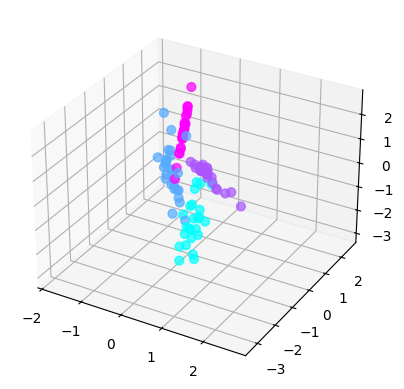

In [191]:
nn = NeuralNetwork(learning_rate=0.1)
X, y = datasets.make_classification(
    n_samples=100,  # row number
    n_features=4, # feature numbers
    n_informative=2, # The number of informative features
    n_redundant = 1, # The number of redundant features
    n_repeated = 1, # The number of duplicated features
    n_classes = 4, # The number of classes 
    n_clusters_per_class=1,#The number of clusters per class
    
)
ax = plt.axes(projection='3d')
ax.scatter3D(X[:,0],X[:,1],X[:,2], s=40, c=y, cmap='cool', alpha=0.7)
y_true = np.zeros((len(y), 4))
y_true[np.arange(len(y)), y] = 1

nn.train(X, y_true, epochs=1000)

y_pred = nn.forward(X)
for i in range(len(y_pred)):
    print(f'Valor real:", {np.round(y_true[i],2)}')
    print(f'Previsao apos treinamento:", {np.round(y_pred[i],2)}')
